In [1]:
import sys,  time
import ipywidgets as widget
from IPython.display import display
import numpy as np
import cv2
from PIL import Image 
from io import BytesIO
cv2.startWindowThread()

0

In [2]:
# !wget https://github.com/AKSHAYUBHAT/TensorFace/raw/master/openface/models/dlib/shape_predictor_68_face_landmarks.dat

In [3]:
import dlib
sd = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")
fr = cv2.face.createEigenFaceRecognizer()
fd = dlib.get_frontal_face_detector()

使用攝影機

In [4]:
cap = cv2.VideoCapture(0)
cap.set(3,1920)
cap.set(4,1080)
while True:
    ret, img0 = cap.read()
    H, W = img0.shape[:2]    
    img = cv2.resize(img0, (W//2,H//2))
    keycode = cv2.waitKey(1) & 0xff
    if  keycode == ord('q'):
        break
    rl = fd(img)
    for r in rl:
        shape = sd(img, r)
        poly = np.int32([(x.x, x.y) for x in shape.parts()])*2
        img0 = cv2.polylines(img0, np.int32([poly[:17]]) , 0, (0,255,255))
        img0 = cv2.polylines(img0, np.int32([poly[17:22]]) , 0, (255,0,255))
        img0 = cv2.polylines(img0, np.int32([poly[22:27]]) , 0, (255,0,255))
        img0 = cv2.polylines(img0, np.int32([poly[27:31]]) , 0, (0,255,0))
        img0 = cv2.polylines(img0, np.int32([poly[30:36]]) , 1, (0,255,0))
        img0 = cv2.polylines(img0, np.int32([poly[36:42]]) , 1, (255,255,255))
        img0 = cv2.polylines(img0, np.int32([poly[42:48]]) , 1, (255,255,255))
        img0 = cv2.polylines(img0, np.int32([poly[48:60]]) , 1, (255,255,0))
        img0 = cv2.polylines(img0, np.int32([poly[60:68]]) , 1, (255,255,0))
        #img = cv2.rectangle(img, (r.left(),r.top()), (r.right(),r.bottom()),  (255,255,0))
    
    img0 = cv2.flip(img0, 1)
    cv2.imshow('frame', img0)
cv2.destroyWindow('frame')
cap.release()

使用圖片

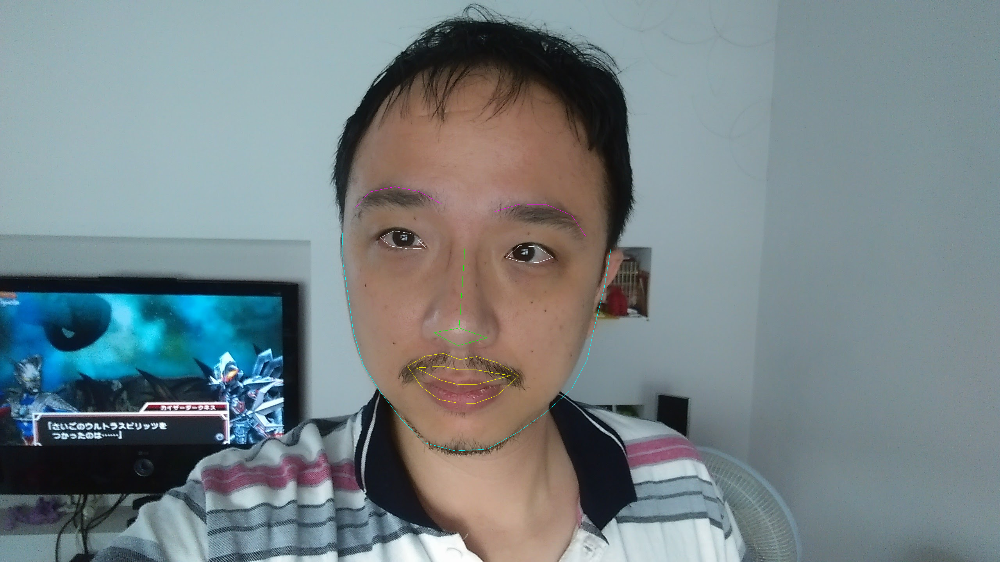

In [5]:
img = np.array(Image.open('img/tjw1.jpg'))
H, W = img.shape[:2]    
rl = fd(img)
for r in rl:
    shape = sd(img, r)
    poly = np.float32([(x.x, x.y) for x in shape.parts()])
    img = cv2.polylines(img, np.int32([poly[:17]]) , 0, (0,255,255))
    img = cv2.polylines(img, np.int32([poly[17:22]]) , 0, (255,0,255))
    img = cv2.polylines(img, np.int32([poly[22:27]]) , 0, (255,0,255))
    img = cv2.polylines(img, np.int32([poly[27:31]]) , 0, (0,255,0))
    img = cv2.polylines(img, np.int32([poly[30:36]]) , 1, (0,255,0))
    img = cv2.polylines(img, np.int32([poly[36:42]]) , 1, (255,255,255))
    img = cv2.polylines(img, np.int32([poly[42:48]]) , 1, (255,255,255))
    img = cv2.polylines(img, np.int32([poly[48:60]]) , 1, (255,255,0))
    img = cv2.polylines(img, np.int32([poly[60:68]]) , 1, (255,255,0))
    #img = cv2.rectangle(img, (r.left(),r.top()), (r.right(),r.bottom()),  (255,255,0))

Image.fromarray(img)

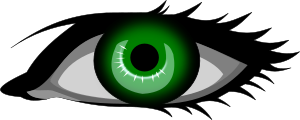

In [6]:
# eye image from openclipart
img_eye = np.array(Image.open('img/secretlondon-Green-eye-300px.png'))
Image.fromarray(img_eye)

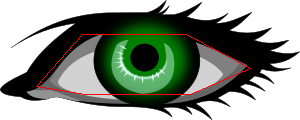

In [7]:
# 手動加上 shape
eye_shape = np.float32(
      [[   36. ,  86. ],
       [  82.8,   34. ],
       [ 186.3,   34. ],
       [ 250.3,   68. ],
       [ 190.9,  94. ],
       [  85.1,  94. ]])
img_eye = np.array(Image.open('img/secretlondon-Green-eye-300px.png'))
img2 = cv2.polylines(img_eye, np.int32([eye_shape]) , 1, (255,0,0,255))
Image.fromarray(img2)

取得轉換矩陣

In [8]:
M = cv2.getPerspectiveTransform(eye_shape[[0,1,3,4]], poly[[42,43,45,46]])
M

array([[  3.19512812e-01,   4.24876706e-01,   1.28986026e+03],
       [ -5.76201392e-02,   9.18774639e-01,   6.03366414e+02],
       [ -1.67087564e-04,   4.45895714e-04,   1.00000000e+00]])

轉換

In [9]:
paste = cv2.warpPerspective(img_eye, M, img.shape[1::-1])

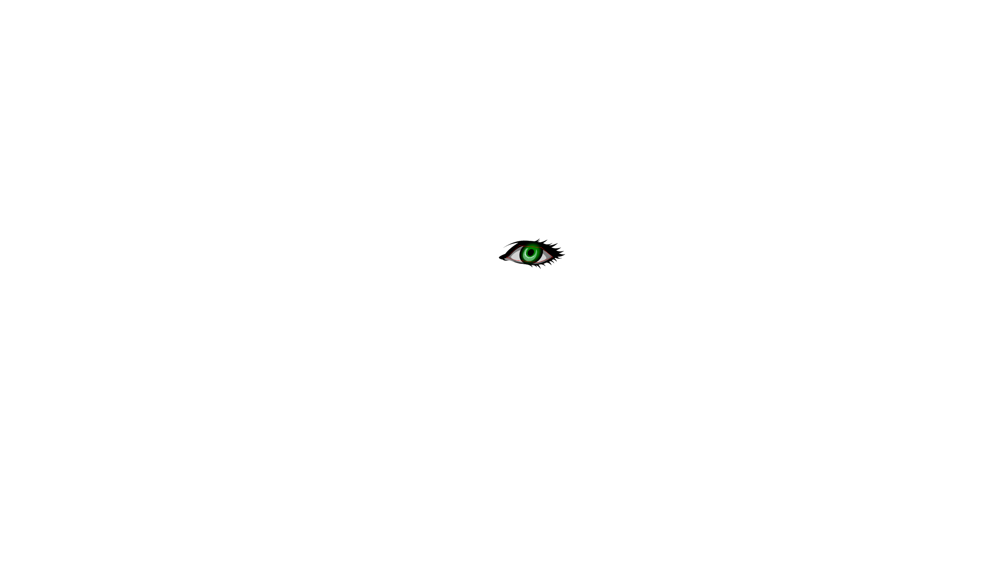

In [10]:
paste = Image.fromarray(paste)
paste

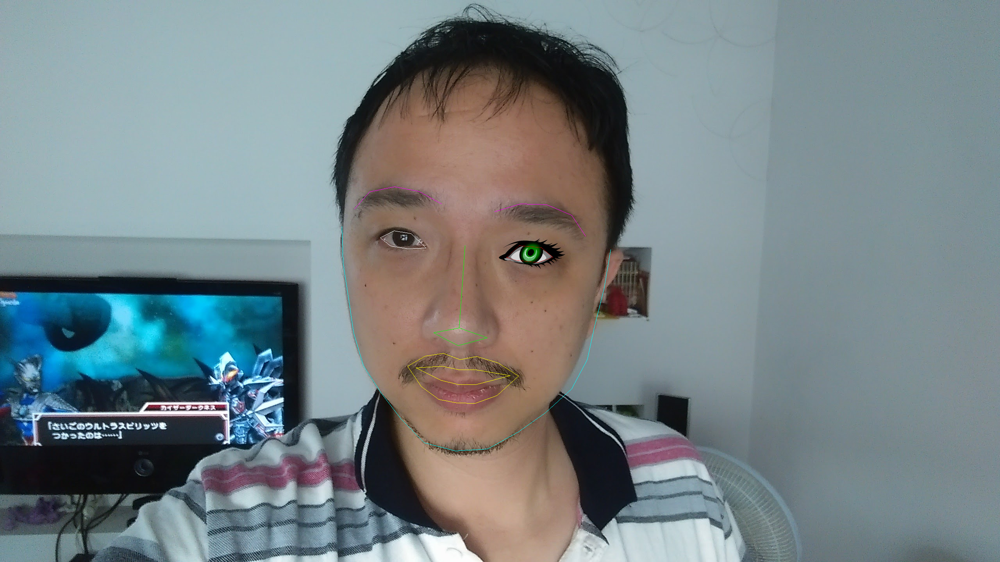

In [11]:
result = Image.fromarray(img)
result.paste(paste,(0, 0), paste)
result

兩眼

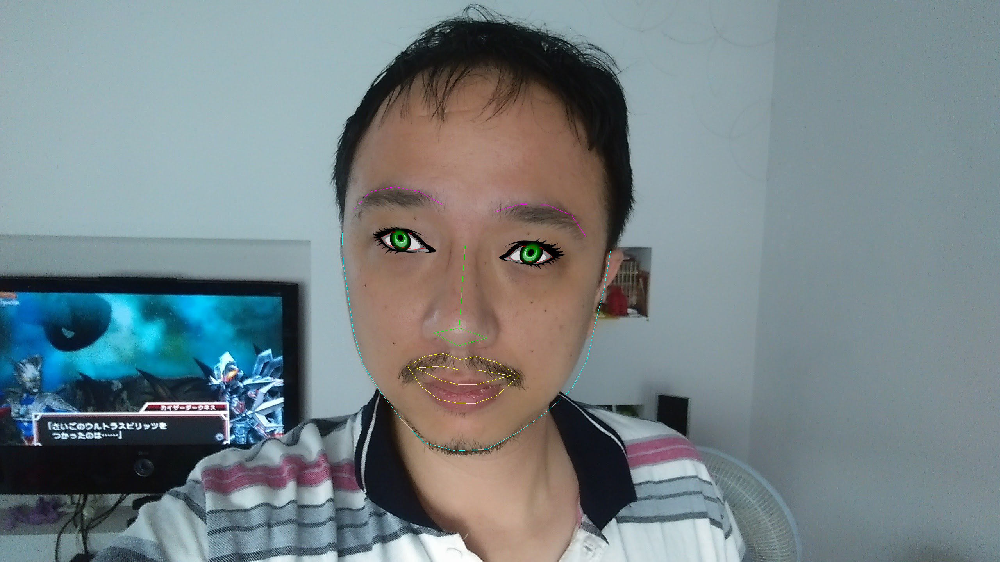

In [12]:
M = cv2.getPerspectiveTransform(eye_shape[[0,1,3,4]], poly[[39,38,36,41]])
paste = cv2.warpPerspective(img_eye, M, img.shape[1::-1])
paste = Image.fromarray(paste)
result.paste(paste, (0,0), paste)
result

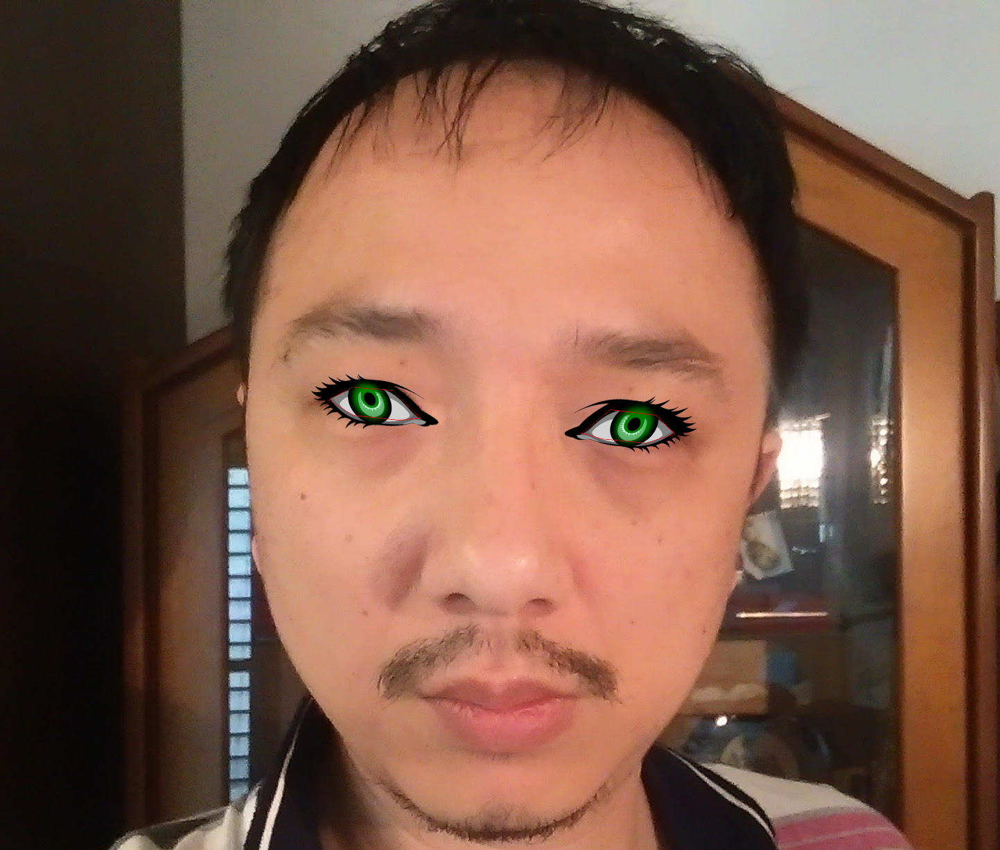

In [13]:
result = img = Image.open("img/tjw2.jpg")
img = np.array(img)
result = Image.fromarray(img)
rl = fd(img)
for r in rl:
    shape = sd(img, r)
    poly = np.float32([(x.x, x.y) for x in shape.parts()])
    # left eye
    M = cv2.getPerspectiveTransform(eye_shape[[0,1,3,4]], poly[[42,43,45,46]])
    paste = cv2.warpPerspective(img_eye, M, img.shape[1::-1])
    paste = Image.fromarray(paste)
    result.paste(paste, (0,0), paste)
    # right eye
    M = cv2.getPerspectiveTransform(eye_shape[[0,1,3,4]], poly[[39,38,36,41]])
    paste = cv2.warpPerspective(img_eye, M, img.shape[1::-1])
    paste = Image.fromarray(paste)
    result.paste(paste, (0,0), paste)
result

攝影機

In [14]:
cap = cv2.VideoCapture(0)
cap.set(3,1920)
cap.set(4,1080)
while True:
    ret, img0 = cap.read()
    H, W = img0.shape[:2]    
    img = cv2.resize(img0, (W//2,H//2))
    keycode = cv2.waitKey(1) & 0xff
    if  keycode == ord('q'):
        break
    rl = fd(img)
    for r in rl:
        shape = sd(img, r)
        rpos = np.float32([r.left(), r.top()])*2
        face = img0[r.top()*2:r.bottom()*2, r.left()*2:r.right()*2]
        if face.size==0:
            continue
        rsize = (face.shape[1], face.shape[0])
        poly = np.float32([(x.x, x.y) for x in shape.parts()])*2-rpos
        result = Image.fromarray(img0)
        M = cv2.findHomography(eye_shape, poly[42:48])[0]
        paste = cv2.warpPerspective(img_eye, M, rsize)
        mask = paste[:,:,3]>=128
        face[mask] = paste[:,:,:3][mask]
        # right eye
        M = cv2.findHomography(eye_shape, poly[[39,38,37,36,41,40]])[0]
        paste = cv2.warpPerspective(img_eye, M, rsize)
        mask = paste[:,:,3]>=128
        face[mask] = paste[:,:,:3][mask]
    img0 = cv2.flip(img0, 1)
    cv2.imshow('frame', img0)
cv2.destroyWindow('frame')
cap.release()